# Denoising with DIP

## Imports

In [1]:
import tensorflow as tf
import os

import matplotlib.pyplot as plt
import numpy as np
import cv2
%matplotlib inline

import copy

from skimage.metrics import peak_signal_noise_ratio #import compare_psnr

In [2]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
    try:
        #tf.config.experimental.set_virtual_device_configuration(
        #gpus[0],
        #[tf.config.experimental.VirtualDeviceConfiguration(memory_limit=2024)])
        tf.config.experimental.set_memory_growth(gpus[0], True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Virtual devices must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


In [3]:
!nvidia-smi

Sun Apr 18 15:03:58 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.39       Driver Version: 460.39       CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce RTX 307...  Off  | 00000000:01:00.0 Off |                  N/A |
| N/A   35C    P3    21W /  N/A |    521MiB /  7982MiB |     15%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Create image

In [4]:
def load_image(fn):
    """
    Load image
    return: image with RGB, range 0-1, float32
    """
    if not os.path.isfile(fn):
        raise ValueError("No file {0}".format(fn))
    img = cv2.imread(fn)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if img.shape[0] != 512 or img.shape[1] != 512:
        img = cv2.resize(img, dsize=(512,512), interpolation=cv2.INTER_CUBIC)
    return(img/255.).astype(np.float32)

In [5]:
def get_noise_image(img_orig, sigma=25):
    """ 
    Add Gaussian noise to image.
    :param img_orig: original image
    :param sigma: std of Gaussian distribution (noise) - Note: if 0-1 range, sigma/255.
    """    
    return np.clip(img_orig + np.random.normal(scale=sigma, size=img_orig.shape), 0, 1).astype(np.float32)
    #return img_noise.astype(np.float32)

In [6]:
def plot_images(im1, im2, figsize=(15,15)):
    fig = plt.figure(figsize=figsize)
    plt.subplot(121); plt.axis('off'); plt.imshow(im1)
    plt.subplot(122); plt.axis('off'); plt.imshow(im2)
    plt.show()

In [7]:
def plot_images2(im, figsize=(15,15), axis=False):
    nr = len(im)
    fig = plt.figure(figsize=figsize)
    for idx in range(nr):    
        plt.subplot(eval("1"+str(nr)+str(idx+1))); plt.axis('off') if axis==False else plt.axis('on'); plt.imshow(im[idx])
    plt.show()

In [8]:
sigma = 25
sigma_ = sigma/255.

original image:  (512, 512, 3) float32 0.0 0.91764706
noisy image:  (512, 512, 3) float32 0.0 1.0


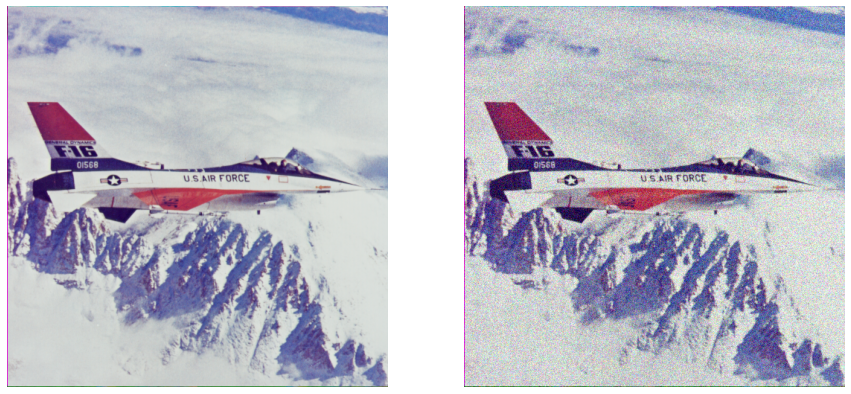

PSNR =  20.3454253985312


In [9]:
img = load_image("../data/F16_GT.png")
#img = load_image("../data/1_769p.jpg")
#img = load_image("../data/zebra_GT.png")
#img = cv2.resize(img, dsize=(128,128), interpolation=cv2.INTER_AREA)
img_noise = get_noise_image(img, sigma_)

print("original image: ",np.shape(img), img.dtype, img.min(), img.max())
print("noisy image: ",np.shape(img_noise), img_noise.dtype, img_noise.min(), img_noise.max())

plot_images(img, img_noise)

print("PSNR = ", peak_signal_noise_ratio(img_noise, img))

## Model definition

In [10]:
num_input_channels=2 
num_output_channels=3
numbers_filters_down=[128,128,128,128, 128]
numbers_filters_up=[128,128,128,128, 128]
numbers_filters_skip=[4, 4, 4, 4, 4]
kernel_down=3 
kernel_up=3 
kernel_skip=1
need1x1_up = True
depth = len(numbers_filters_down) -1
pad = 'reflection'
need_sigmoid = True

In [11]:
class ReflectionPadding2D(tf.keras.layers.Layer):
    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        self.input_spec = [tf.keras.layers.InputSpec(ndim=4)]
        super(ReflectionPadding2D, self).__init__(**kwargs)

    def compute_output_shape(self, s):
        """ If you are using "channels_last" configuration"""
        return (s[0], s[1] + 2 * self.padding[0], s[2] + 2 * self.padding[1], s[3])

    def call(self, x, mask=None):
        w_pad,h_pad = self.padding
        return tf.pad(x, [[0,0], [h_pad,h_pad], [w_pad,w_pad], [0,0] ], 'REFLECT')

In [12]:
def convolutional_layer(x, filters, kernel_size, strides, 
                        pad='reflection', downsample_mode='stride'):
    # padding
    to_pad = (int((kernel_size - 1) / 2), int((kernel_size - 1) / 2))
    if pad == 'reflection':
        x = ReflectionPadding2D(to_pad)(x)
    
    # conv2D
    downsample_stride = strides
    if strides[0] != 1 and downsample_mode != 'stride':
        strides = (1,1)
    x = tf.keras.layers.Conv2D(filters=filters, kernel_size=kernel_size, strides=strides)(x)
    
    # downsampling
    if downsample_stride[0] != 1 and downsample_mode != 'stride':
        if downsample_mode == 'avg':
            x = tf.keras.layers.AveragePooling2D(pool_size=downsample_stride, 
                                                          strides=downsample_stride)(x)
        elif downsample_mode == 'max':
            x = tf.keras.layers.MaxPool2D(pool_size=downsample_stride, 
                                                    strides=downsample_stride)(x)
        else:
            raise ValueError("downsample_mode {0} not valid.".format(downsample_mode))
    return x

In [13]:
def convolutional_block(x, filters, kernel_size, strides, 
                        pad='reflection', downsample_mode='stride',
                        act='leaky_relu'):
    
    # padding + conv + downsampling
    x = convolutional_layer(x, filters, kernel_size, strides, pad, downsample_mode)
    # bn + activation
    x = tf.keras.layers.BatchNormalization(momentum=0.1, epsilon=1e-05)(x)
    if act == 'leaky_relu':
        x = tf.keras.layers.LeakyReLU(alpha=0.2) (x)
    return x

In [14]:
input_layer = tf.keras.Input(shape=(512,512,32), batch_size=1, name='input', dtype=None, sparse=False, tensor=None)
x = input_layer

skip_block = []

kd = kernel_down
ku = kernel_up
ks = kernel_skip

for idx, nd in enumerate(numbers_filters_down):
    
    # first conv block
    x = convolutional_block(x, filters=nd, kernel_size=3, strides=(2,2), 
                            pad='reflection', downsample_mode='stride',
                            act='leaky_relu')
    # second conv block
    x = convolutional_block(x, filters=nd, kernel_size=3, strides=(1,1), 
                            pad='reflection', downsample_mode='stride',
                            act='leaky_relu')
    
    # skip connection
    #print(x)
    skip = convolutional_block(x, filters=4, kernel_size=1, strides=(1,1), 
                        pad='reflection', downsample_mode='stride',
                        act='leaky_relu')
    skip_block.append(skip)
    
# bridge
x = skip_block.pop(-1)

for idx, nu in enumerate(reversed(numbers_filters_up[1:])):
    
    # first conv block
    x = tf.keras.layers.BatchNormalization(momentum=0.1, epsilon=1e-05, name="BN_"+str(idx))(x)
    x = convolutional_block(x, filters=nu, kernel_size=3, strides=(1,1), 
                            pad='reflection', downsample_mode='stride',
                            act='leaky_relu')
    # second conv block 1x1 convolution
    if need1x1_up:
        x = convolutional_block(x, filters=nu, kernel_size=1, strides=(1,1), 
                                pad='reflection', downsample_mode='stride',
                                act='leaky_relu')
    # upsample
    x = tf.keras.layers.UpSampling2D(size=2, interpolation='bilinear')(x)    
    up = x    
    
    # concatenate
    x = tf.keras.layers.concatenate([skip_block[depth-1-idx], x], axis=3)

# last step in up filters
x = tf.keras.layers.BatchNormalization(momentum=0.1, epsilon=1e-05)(x)
x = convolutional_block(x, filters=numbers_filters_up[0], kernel_size=3, strides=(1,1), 
                        pad='reflection', downsample_mode='stride',
                        act='leaky_relu')
# second conv block 1x1 convolution
if need1x1_up:
    x = convolutional_block(x, filters=numbers_filters_up[0], kernel_size=1, strides=(1,1), 
                            pad='reflection', downsample_mode='stride',
                            act='leaky_relu')
    
# last upsample
x = tf.keras.layers.UpSampling2D(size=2, interpolation='bilinear')(x)    
    
    
# last conv layer -> filter = 3
x = convolutional_layer(x, filters=3, kernel_size=3, strides=(1,1), 
                        pad='reflection', downsample_mode='stride')
# sigmoid activation
if need_sigmoid:
    x = tf.keras.activations.sigmoid(x)

In [15]:
model = tf.keras.Model(inputs=input_layer, outputs=x)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(1, 512, 512, 32)]  0                                            
__________________________________________________________________________________________________
reflection_padding2d (Reflectio (1, 514, 514, 32)    0           input[0][0]                      
__________________________________________________________________________________________________
conv2d (Conv2D)                 (1, 256, 256, 128)   36992       reflection_padding2d[0][0]       
__________________________________________________________________________________________________
batch_normalization (BatchNorma (1, 256, 256, 128)   512         conv2d[0][0]                     
______________________________________________________________________________________________

# Prepare input

In [16]:
shape = [1, 512,512, 32]
var=1./10
net_input = tf.random.uniform(shape)
net_input *= var
print("net input: ", net_input.shape, net_input.dtype, np.min(net_input), np.max(net_input))

net input:  (1, 512, 512, 32) <dtype: 'float32'> 0.0 0.09999999


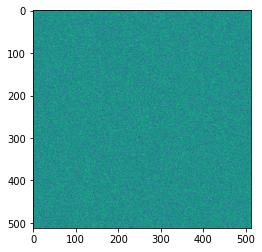

In [52]:
plt.imshow(net_input[0,:,:,0])

noisy tf image:  (1, 512, 512, 3) <dtype: 'float32'> 0.0 1.0


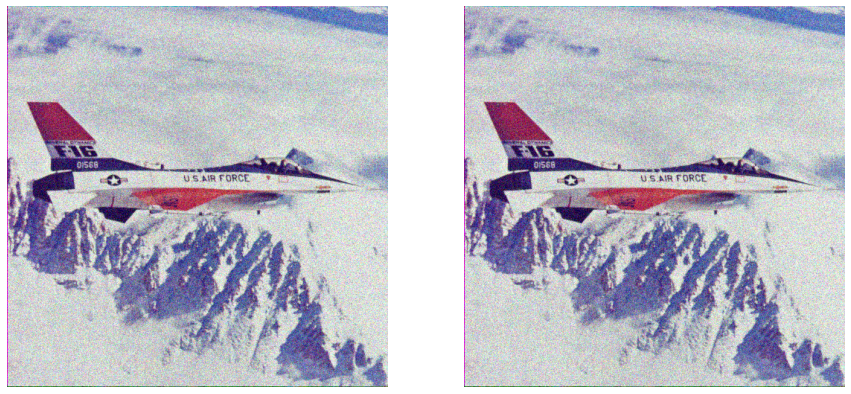

In [17]:
img_noisy_tf = tf.convert_to_tensor(img_noise.reshape(1,*img_noise.shape))
print("noisy tf image: ", img_noisy_tf.shape, img_noisy_tf.dtype, np.min(img_noisy_tf), np.max(img_noisy_tf))
plot_images(img_noise, img_noisy_tf[0])

In [18]:
peak_signal_noise_ratio(img_noise, img)

20.3454253985312

# Setup training

In [19]:
learning_rate = 0.01
num_iter = 3000
psrn_noisy_last = 0
reg_noise_std = 1./30.
exp_weight=0.99

In [20]:
# optimizer and loss
adam = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=0.9, beta_2=0.999, 
                                     epsilon=1e-08, amsgrad=False,name='Adam')

mse = tf.keras.losses.MeanSquaredError(reduction=tf.keras.losses.Reduction.AUTO)

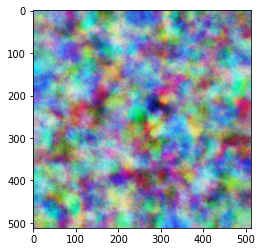

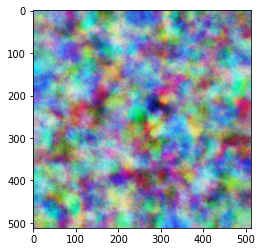

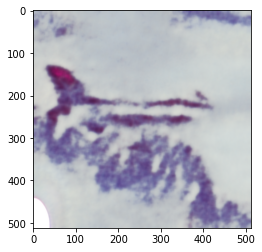

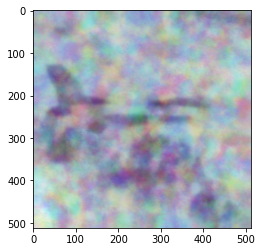

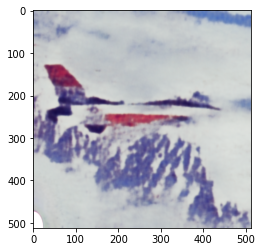

...

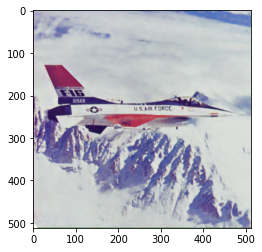

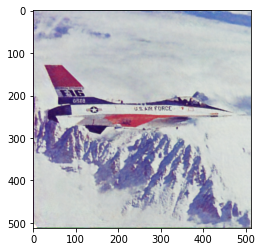

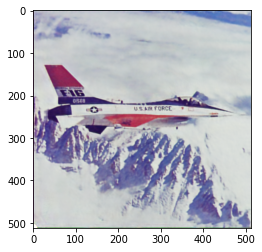

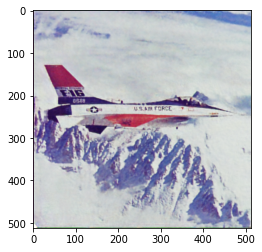

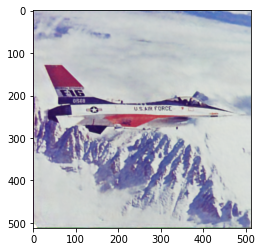

In [21]:
net_input_saved = copy.deepcopy(net_input)
noise = copy.deepcopy(net_input)
output_avg = None

shape = [1,512,512,32]
for epoch in range(num_iter):    
    if reg_noise_std > 0: # add again noise to input image
        net_input = net_input_saved + (tf.random.normal(shape) * reg_noise_std)
    
    # Open a GradientTape to record the operations run
    # during the forward pass, which enables auto-differentiation.
    with tf.GradientTape() as tape:

        # Run the forward pass of the layer.
        # The operations that the layer applies
        # to its inputs are going to be recorded
        # on the GradientTape.
        output = model(net_input, training=True)  # Logits for this minibatch

        # Compute the loss value for this minibatch.
        loss_value = mse(img_noisy_tf, output)
        
    # smoothing
    if output_avg is None:
        output_avg = copy.deepcopy(output)
    else:
        output_avg = output_avg * exp_weight + output * (1 - exp_weight)
        
    # compare psnr
    output_np = tf.make_ndarray(tf.make_tensor_proto(output))[0]
    output_avg_np = tf.make_ndarray(tf.make_tensor_proto(output_avg))[0]
    psrn_noisy = peak_signal_noise_ratio(img_noise, output_np)
    psrn_gt    = peak_signal_noise_ratio(img, output_np)
    psrn_gt_sm = peak_signal_noise_ratio(img, output_avg_np) 
    
    
    # Note that we do not have GT for the "snail" example
    # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
    print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % 
           (epoch, loss_value.numpy(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='')
    if  True and epoch % 100 == 0:
        plt.imshow(output_np)
        plt.show()
        plt.imshow(output_avg_np)
        plt.show()
        
    # Use the gradient tape to automatically retrieve
    # the gradients of the trainable variables with respect to the loss.
    grads = tape.gradient(loss_value, model.trainable_weights)

    # Run one step of gradient descent by updating
    # the value of the variables to minimize the loss.
    adam.apply_gradients(zip(grads, model.trainable_weights))

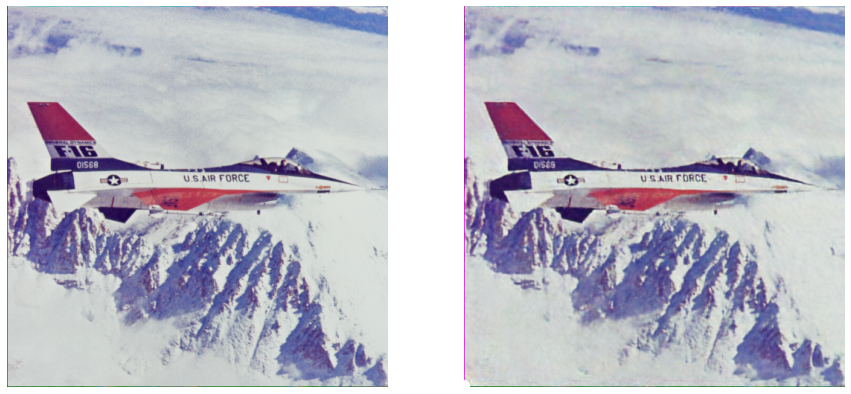

PSNR:  30.259133027316068


In [22]:
out_np = model(net_input).numpy()[0]
plot_images(img, out_np)
print("PSNR: ", peak_signal_noise_ratio(img, output_np))

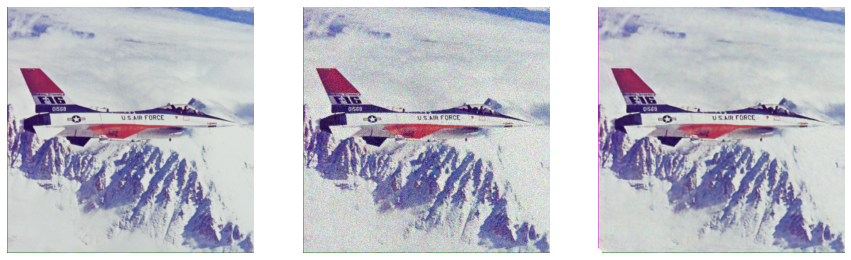

In [23]:
plot_images2([img, img_noise, out_np])

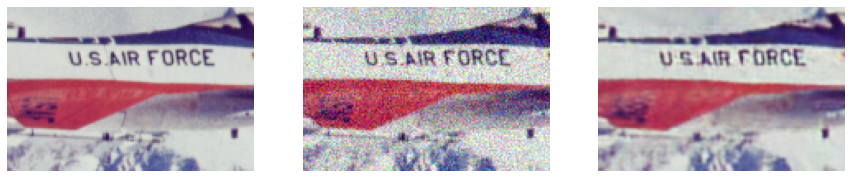

In [31]:
plot_images2([img[200:300,200:350], img_noise[200:300,200:350], out_np[200:300,200:350]])

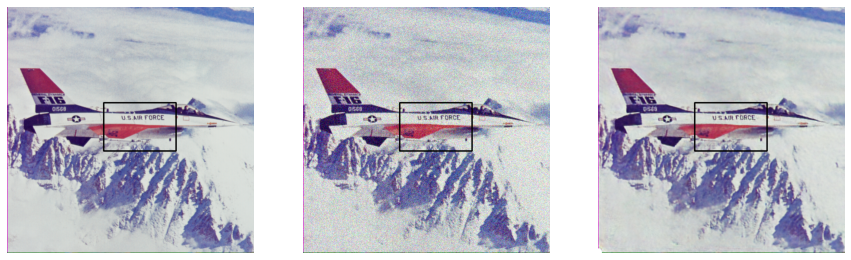

In [43]:
toshow = img.copy()
toshow = cv2.rectangle(toshow, (200,200), (350,300), (0,0,0), 2)

toshow2 = img_noise.copy()
toshow2 = cv2.rectangle(toshow2, (200,200), (350,300), (0,0,0), 2)

toshow3 = out_np.copy()
toshow3 = cv2.rectangle(toshow3, (200,200), (350,300), (0,0,0), 2)

plot_images2([toshow, toshow2, toshow3])